In [3]:
import joblib
import os
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
from sklearn.preprocessing import StandardScaler

C:\Users\Chamodi\AppData\Roaming\Python\Python311\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [4]:
# Load the dataset
#data = pd.read_csv("Outlier_Filtered_Dataset.csv")
output_file_path = "Outlier_Filtered_Dataset.csv"
processed_data = pd.read_csv(output_file_path, parse_dates=['instance_date'])

In [5]:
processed_data

,transaction_id,procedure_id,trans_group_id,trans_group_en,procedure_name_en,instance_date,property_type_id,property_type_en,property_usage_en,reg_type_id,...,nearest_metro_en,nearest_mall_en,rooms_en,has_parking,procedure_area,actual_worth,meter_sale_price,rooms_numeric,z_score,modified_z
0,2-13-2010-1387,13,2,Mortgages,Mortgage Registration,2010-03-30,4,Villa,Residential,1,...,Damac Properties,Marina Mall,3 B/R,0,331.30,1505000.0,4542.71,3.000000,0.001528,0.591418
1,2-13-2015-7852,13,2,Mortgages,Mortgage Registration,2015-10-26,4,Villa,Residential,1,...,Damac Properties,Marina Mall,2 B/R,0,315.31,1260000.0,3996.07,2.000000,-0.053268,0.273800
2,1-110-2007-100813,110,1,Sales,Lease to Own Registration,2007-11-22,4,Villa,Residential,1,...,Nakheel Metro Station,Marina Mall,3 B/R,0,257.69,661888.0,2568.54,3.000000,-0.187038,-0.501593
3,1-11-2007-101072,11,1,Sales,Sell,2007-11-22,4,Villa,Residential,1,...,Nakheel Metro Station,Marina Mall,3 B/R,0,455.83,2300000.0,5045.74,3.000000,0.179333,1.622056
4,1-11-2007-100644,11,1,Sales,Sell,2007-08-01,4,Villa,Residential,1,...,Nakheel Metro Station,Marina Mall,3 B/R,0,455.83,1850000.0,4058.53,3.000000,0.078689,1.038676
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
791494,1-102-2023-8646,102,1,Sales,Sell - Pre registration,2023-02-23,3,Unit,Residential,0,...,Dubai Internet City,Mall of the Emirates,Studio,1,40.88,639000.0,15631.12,1.884737,-0.192157,-0.531265
791495,1-11-2017-5101,11,1,Sales,Sell,2017-04-10,3,Unit,Residential,1,...,Rashidiya Metro Station,City Centre Mirdif,Studio,0,44.00,320000.0,7272.73,1.884737,-0.263503,-0.944816
791496,1-45-2015-546,45,1,Sales,Sell Development,2015-10-05,3,Unit,Commercial,1,...,Unknown,City Centre Mirdif,Office,1,122.65,750000.0,6114.96,1.884737,-0.167332,-0.387364
791497,1-11-2014-20712,11,1,Sales,Sell,2014-09-07,3,Unit,Residential,1,...,Rashidiya Metro Station,City Centre Mirdif,1 B/R,0,69.00,530000.0,7681.16,1.000000,-0.216536,-0.672572


In [6]:
print(processed_data.isnull().sum())

transaction_id         0
procedure_id           0
trans_group_id         0
trans_group_en         0
procedure_name_en      0
instance_date          0
property_type_id       0
property_type_en       0
property_usage_en      0
reg_type_id            0
reg_type_en            0
area_id                0
area_name_en           0
nearest_landmark_en    0
nearest_metro_en       0
nearest_mall_en        0
rooms_en               0
has_parking            0
procedure_area         0
actual_worth           0
meter_sale_price       0
rooms_numeric          0
z_score                0
modified_z             0
dtype: int64


In [7]:
for column in processed_data.select_dtypes(include=['object']).columns:
    processed_data[column].fillna(processed_data[column].mode()[0], inplace=True)

C:\Users\Chamodi\AppData\Local\Temp\ipykernel_32616\680043349.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  processed_data[column].fillna(processed_data[column].mode()[0], inplace=True)


In [8]:
# Create a directory to store models
os.makedirs("models_by_area", exist_ok=True)

In [9]:
# Store evaluation metrics per area
evaluation_results = []
models = {}  # List to store models for each area
X_tests = {}  # List to store corresponding X_test for each are

In [10]:
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5],  # Increase min_samples_split to avoid underfitting
    'min_samples_leaf': [1, 2],
    'bootstrap': [True, False],
    'max_features': ['sqrt', 'log2'],
    'criterion': ['squared_error', 'absolute_error']
}

C:\Users\Chamodi\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_regression.py:996: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


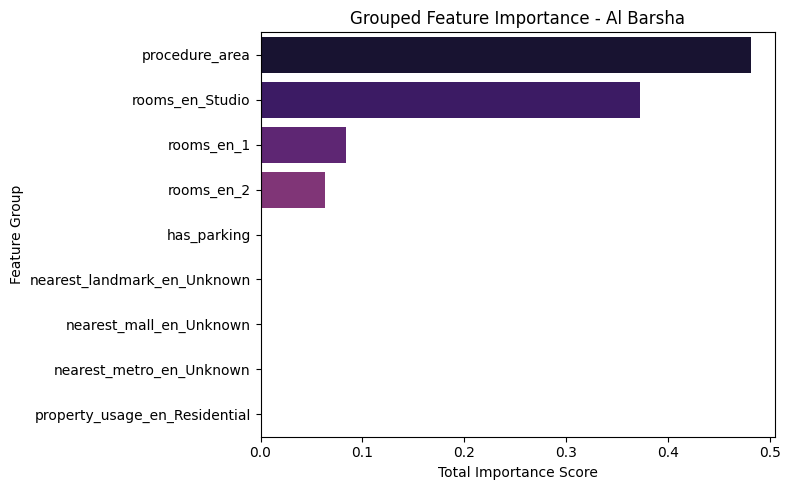

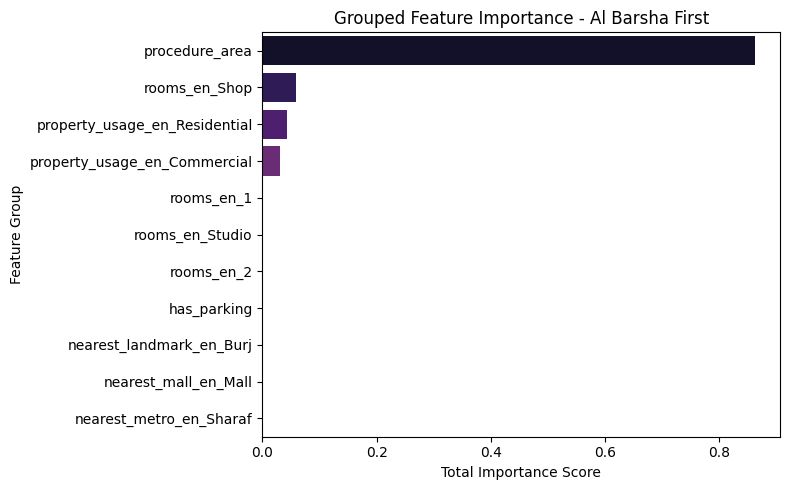

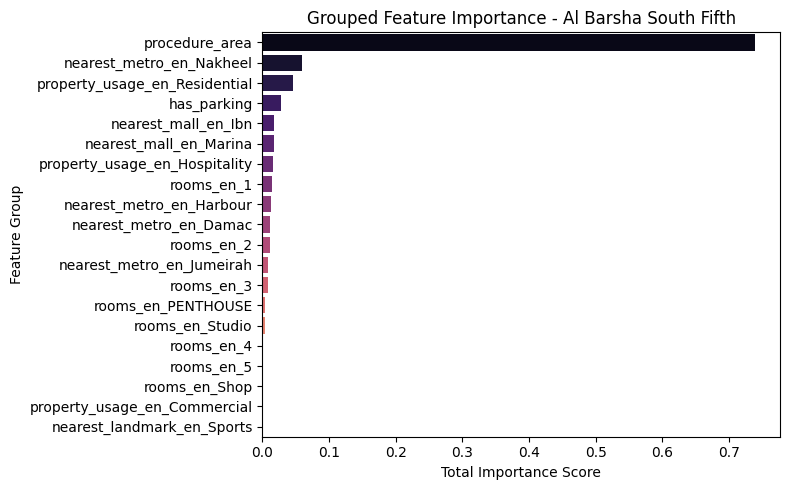

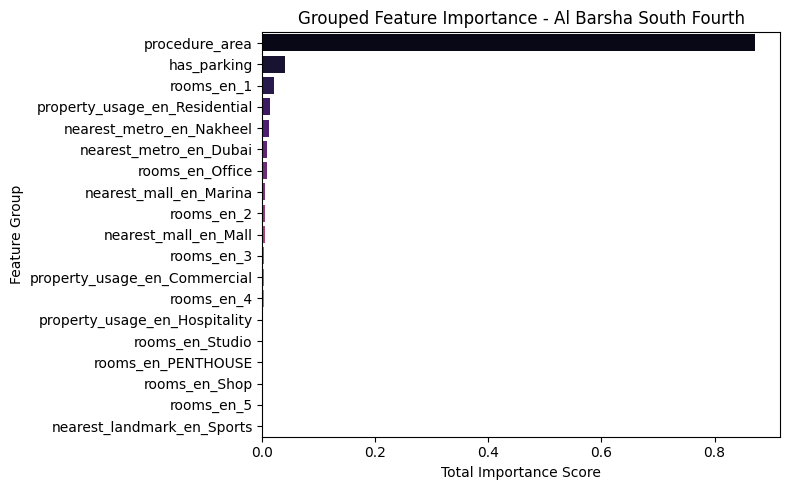

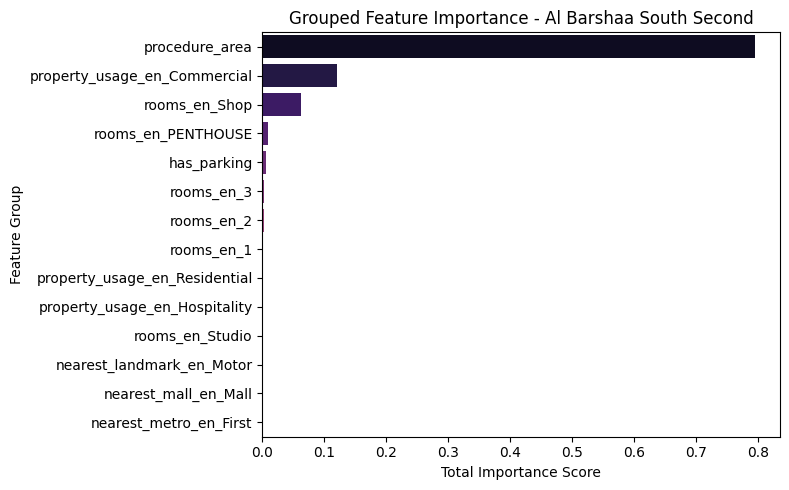

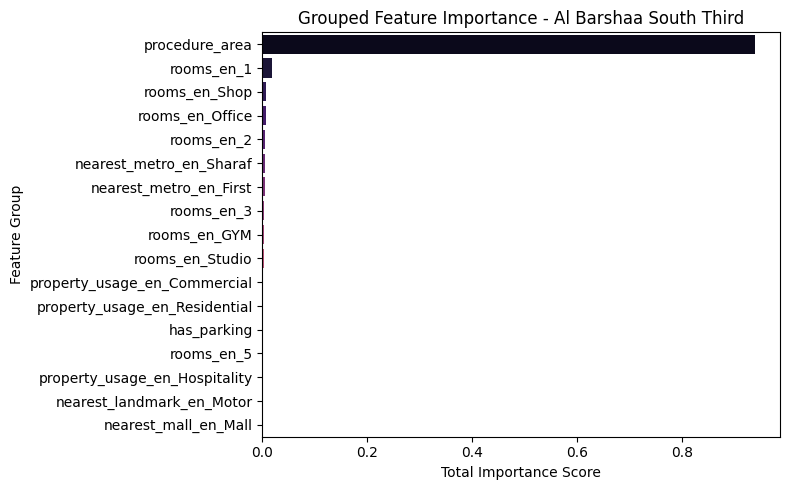

C:\Users\Chamodi\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_regression.py:996: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


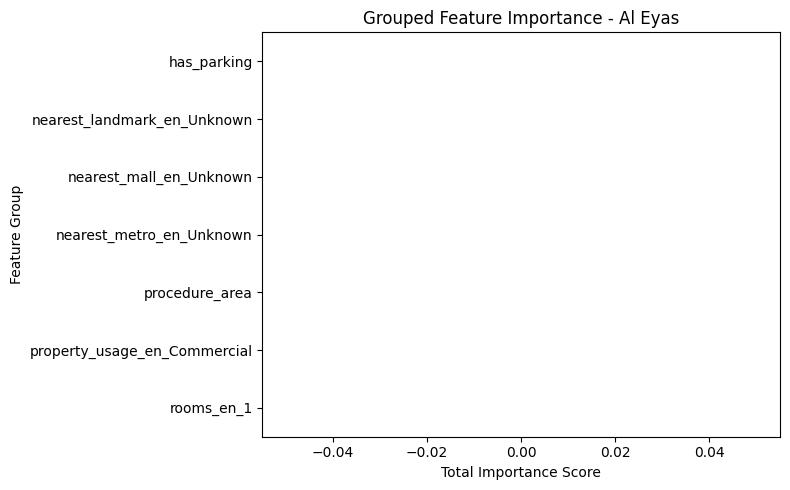

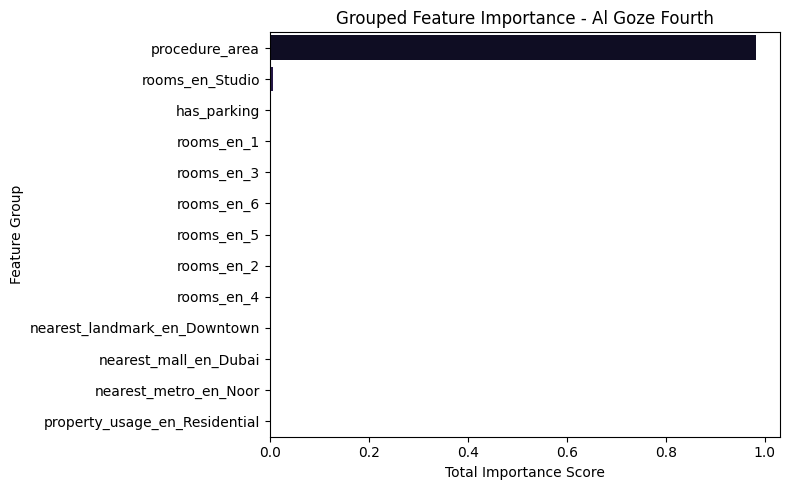

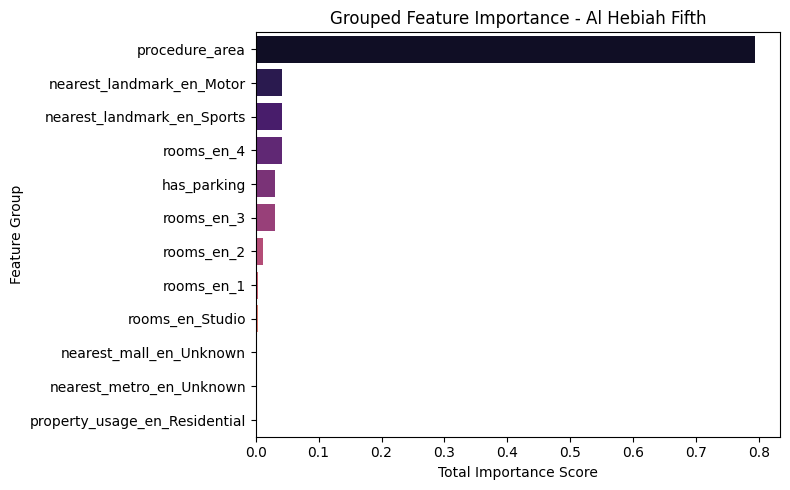

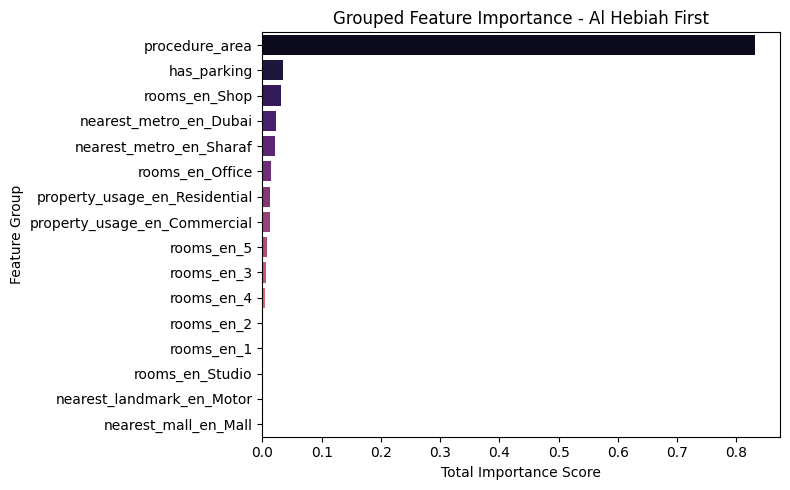

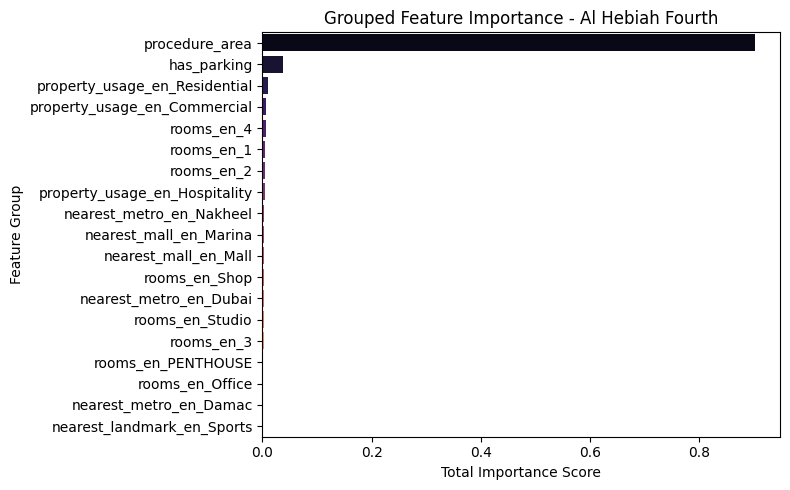

...

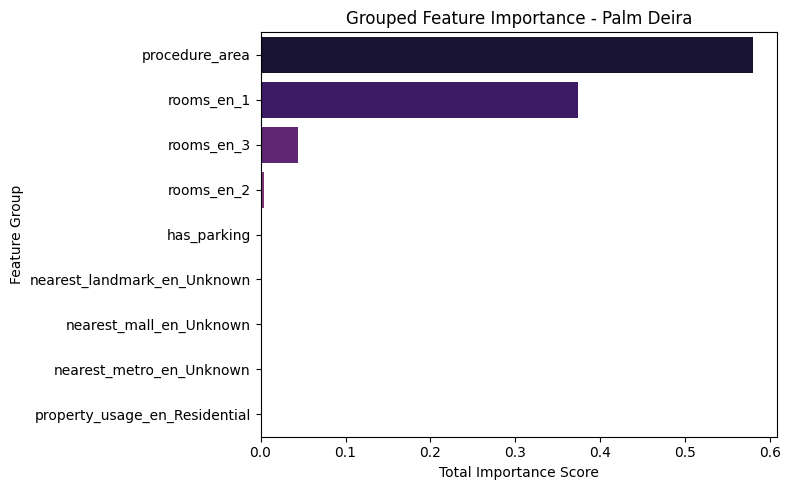

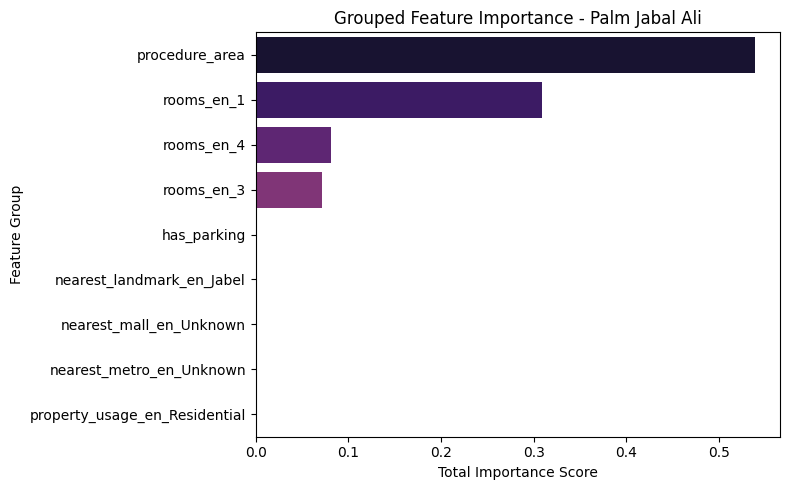

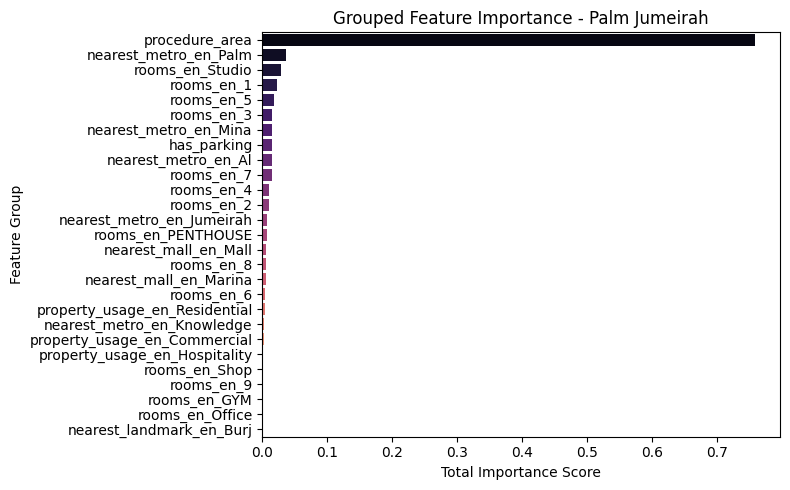

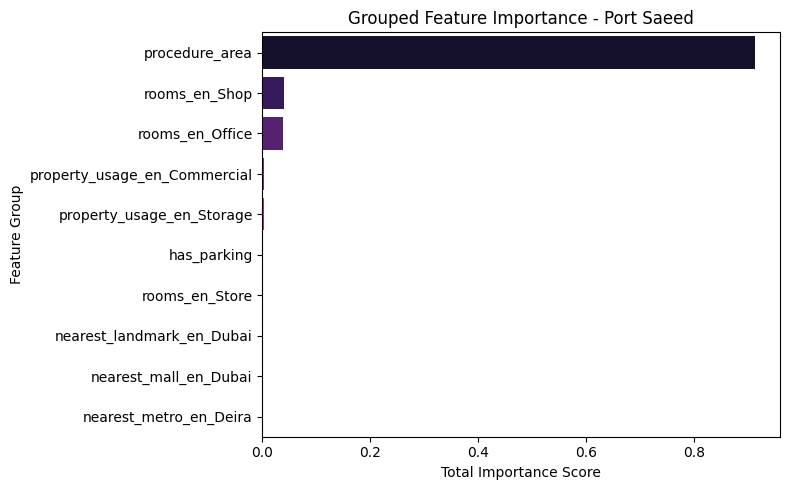

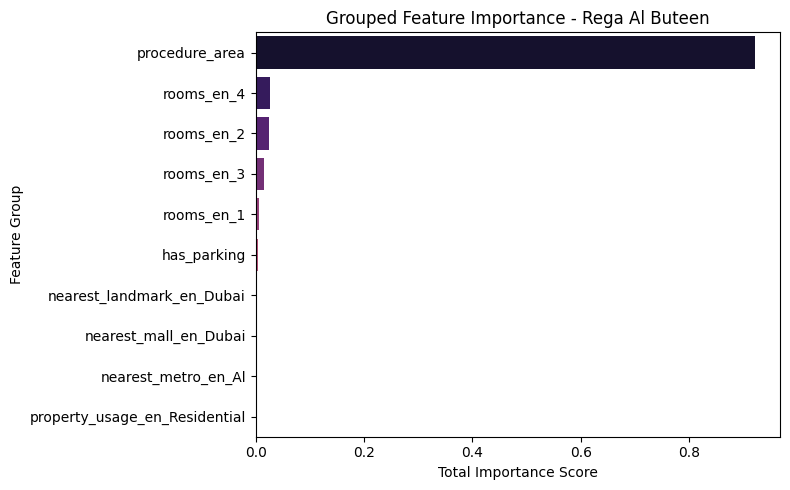

C:\Users\Chamodi\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_regression.py:996: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


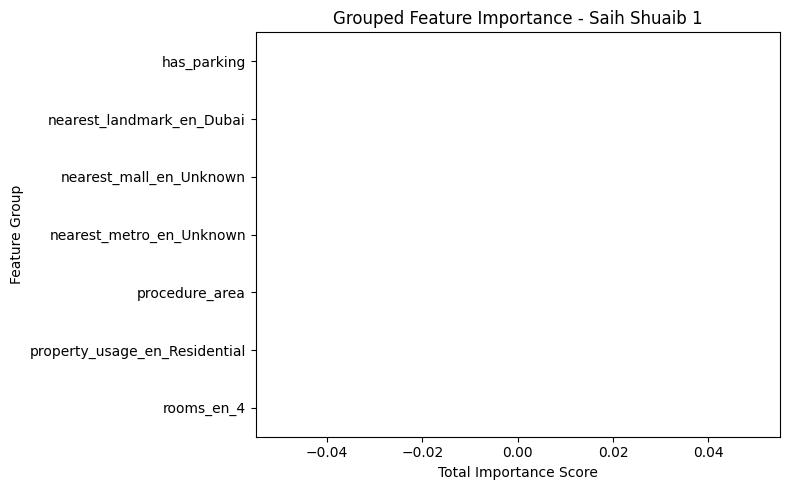

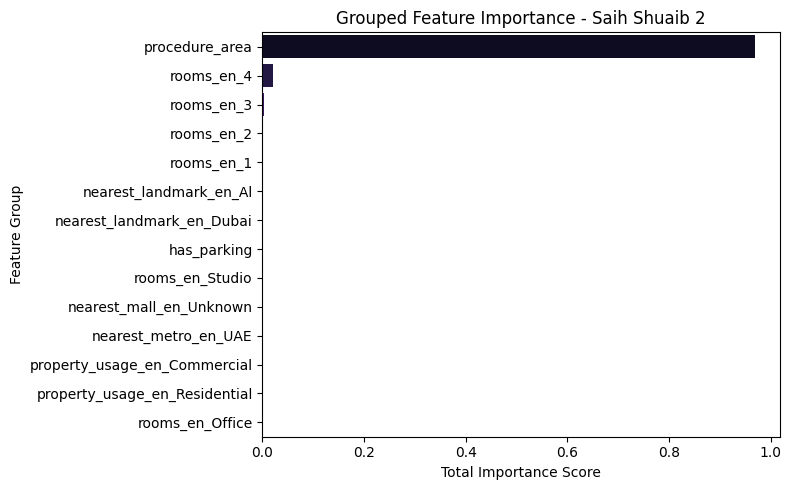

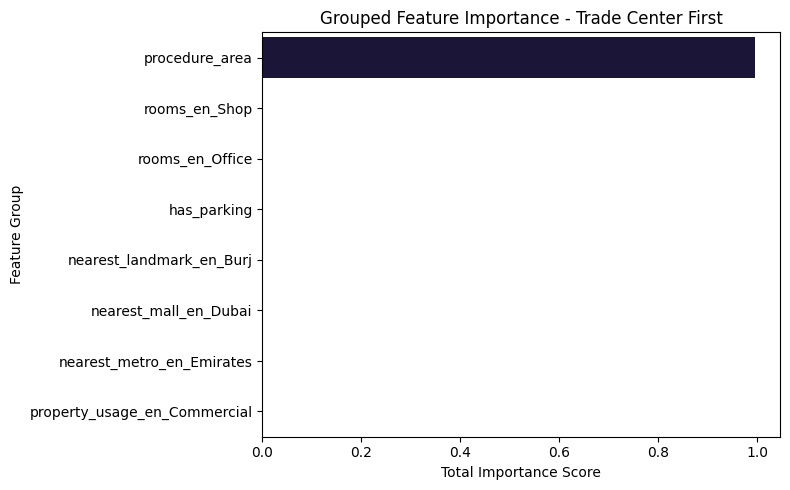

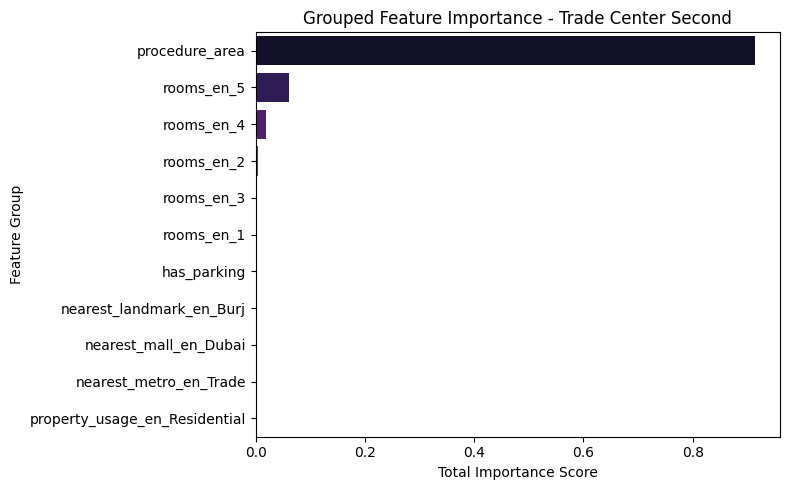

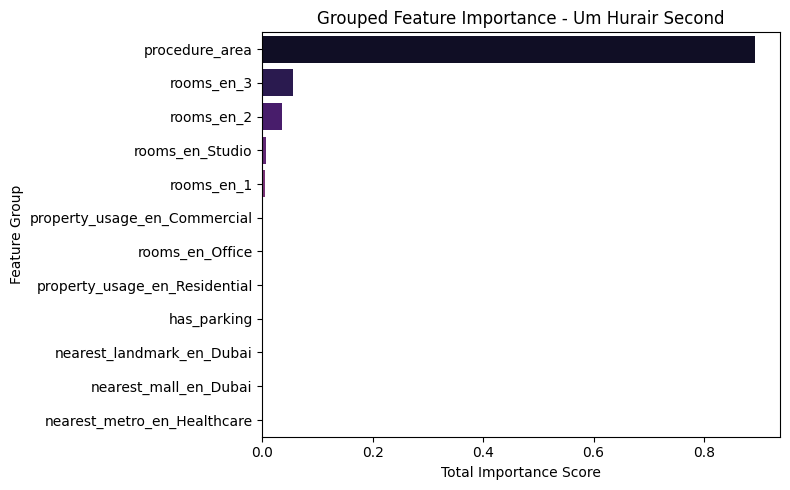

...

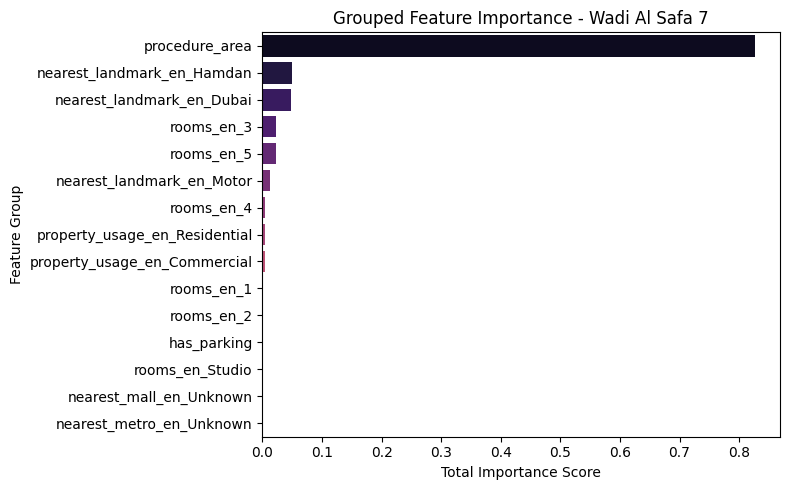

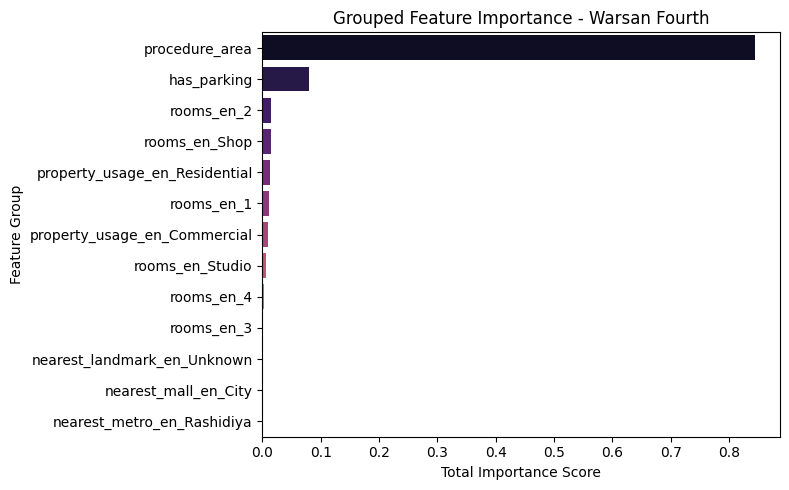

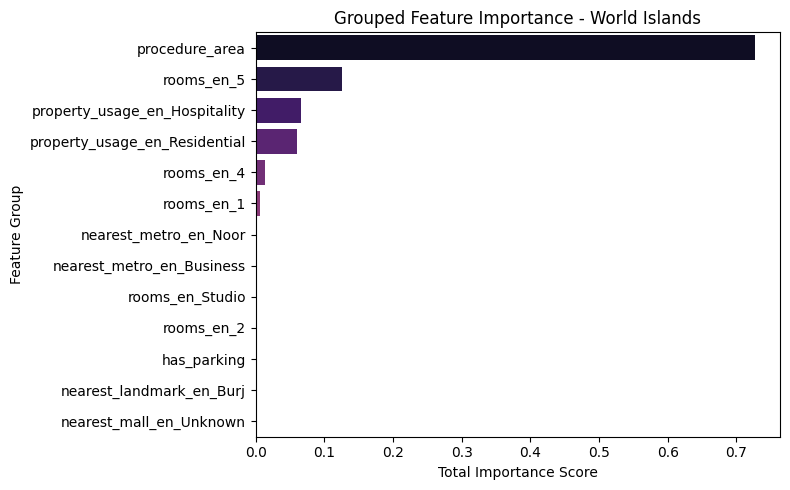

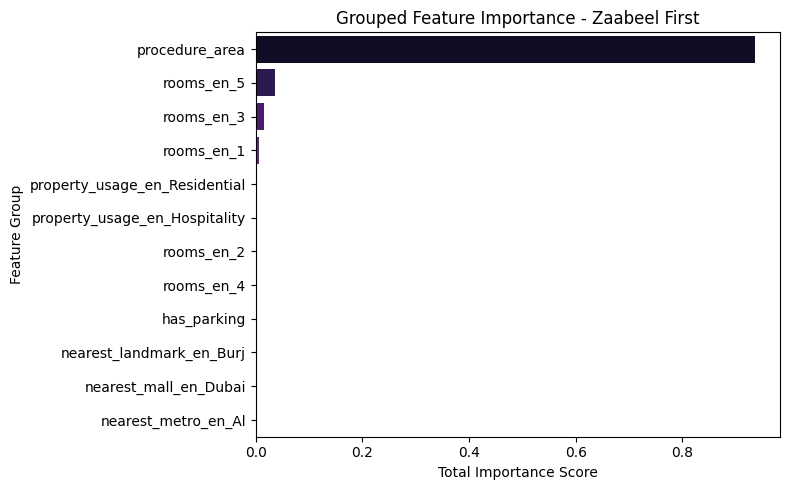

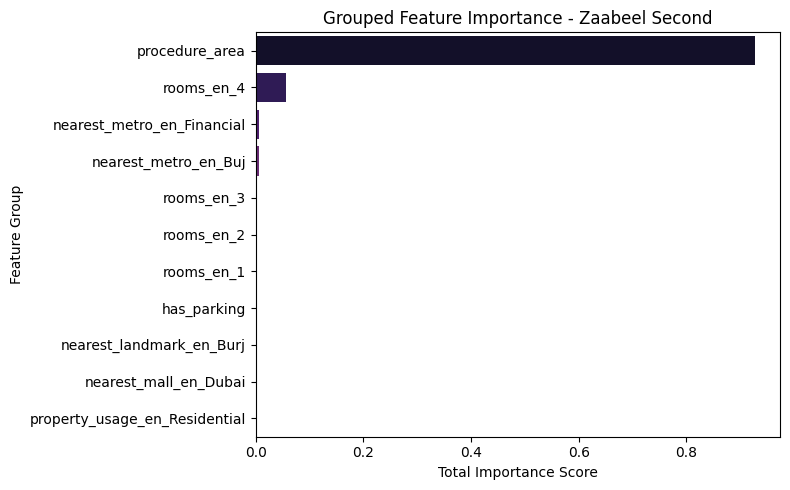

In [11]:
# Group and train
for prop_type, group in processed_data.groupby("area_name_en"):
    X = group[['has_parking', 'procedure_area', 'nearest_landmark_en', 'nearest_metro_en', 'nearest_mall_en', 'property_usage_en', 'rooms_en']]
    y = group["actual_worth"]

    X_encoded = pd.get_dummies(X)
    X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)
    
    # Initialize Random Forest model
    model = RandomForestRegressor(random_state=42)
    
    # Train the model
    model.fit(X_train, y_train)
    
    # Evaluate the model
    y_pred = model.predict(X_test)
    rmse = mean_squared_error(y_test, y_pred, squared=False)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Append results
    evaluation_results.append({
        "Area": prop_type,
        "RMSE": round(rmse, 2),
        "MAE": round(mae, 2),
        "R2": round(r2, 2)
    })
    
    # Store models and X_tests for later use
    models[prop_type] = model
    X_tests[prop_type] = X_test

    # --- Clean Feature Importance Plot ---
    importances = model.feature_importances_
    feature_names = X_encoded.columns

    # Group by base feature name
    base_features = feature_names.str.extract(r"^([a-zA-Z0-9_]+)")[0]
    grouped_importance = pd.DataFrame({
        "Base Feature": base_features,
        "Importance": importances
    }).groupby("Base Feature", as_index=False).sum().sort_values(by="Importance", ascending=False)
    
    # Save the model and its columns
    joblib.dump((model, X_encoded.columns.tolist()), f"models_by_area/{prop_type}.pkl")

    # Plot
    plt.figure(figsize=(8, 5))
    sns.barplot(data=grouped_importance, x="Importance", y="Base Feature", palette="magma")
    plt.title(f"Grouped Feature Importance - {prop_type}")
    plt.xlabel("Total Importance Score")
    plt.ylabel("Feature Group")
    plt.tight_layout()
    plt.show()

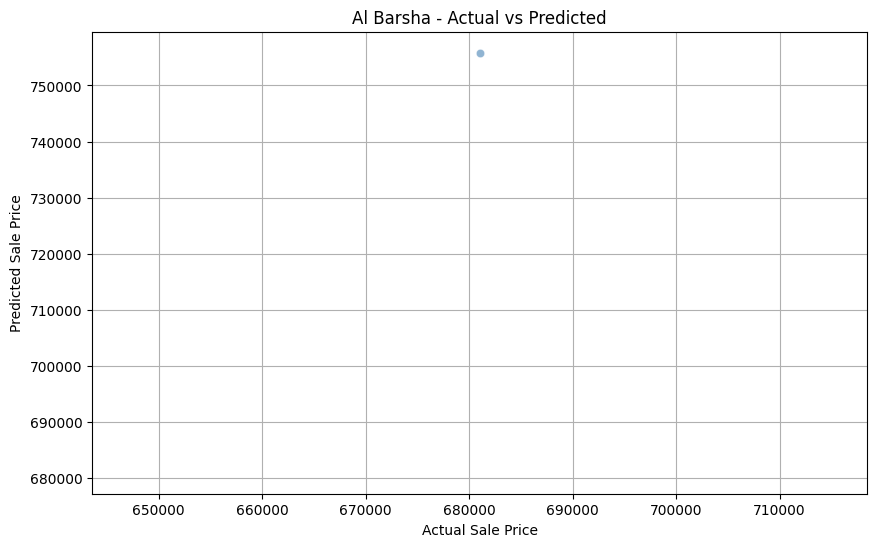

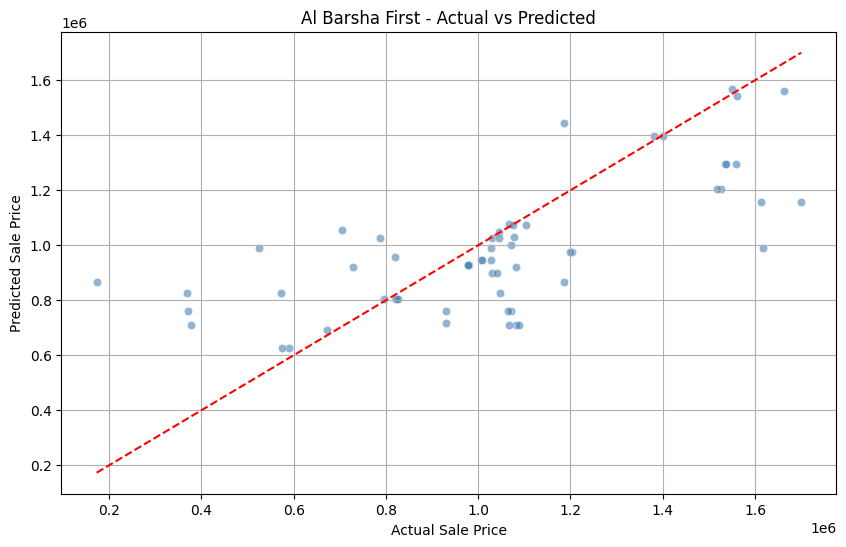

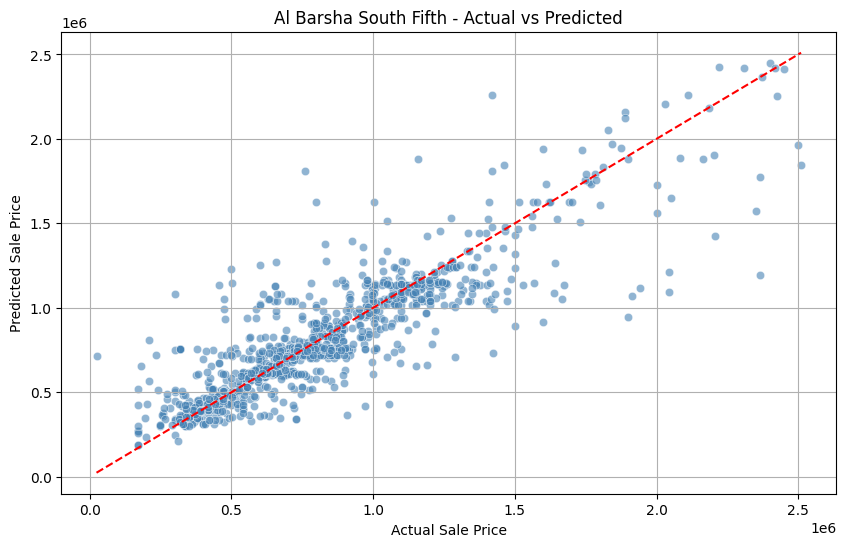

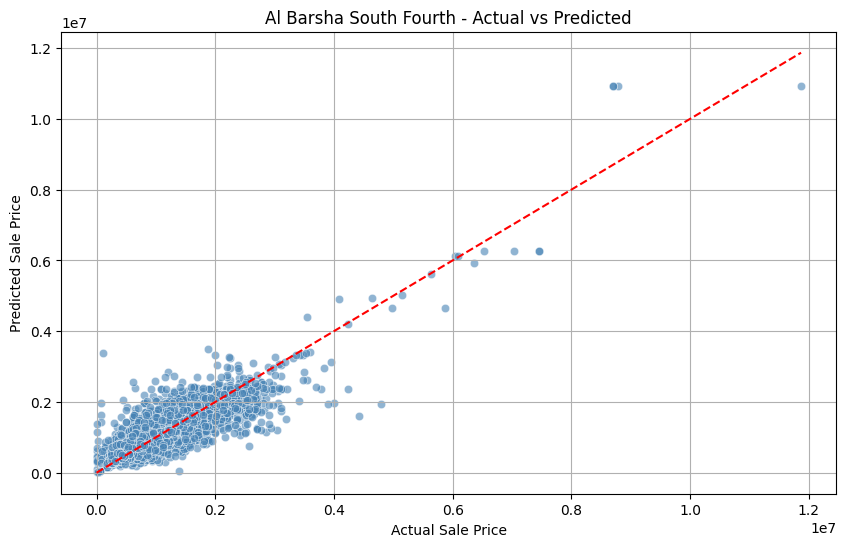

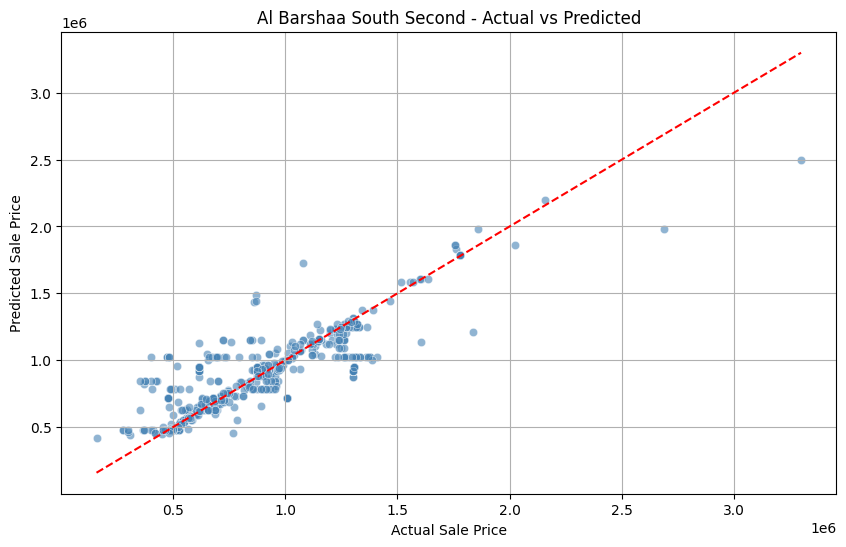

...

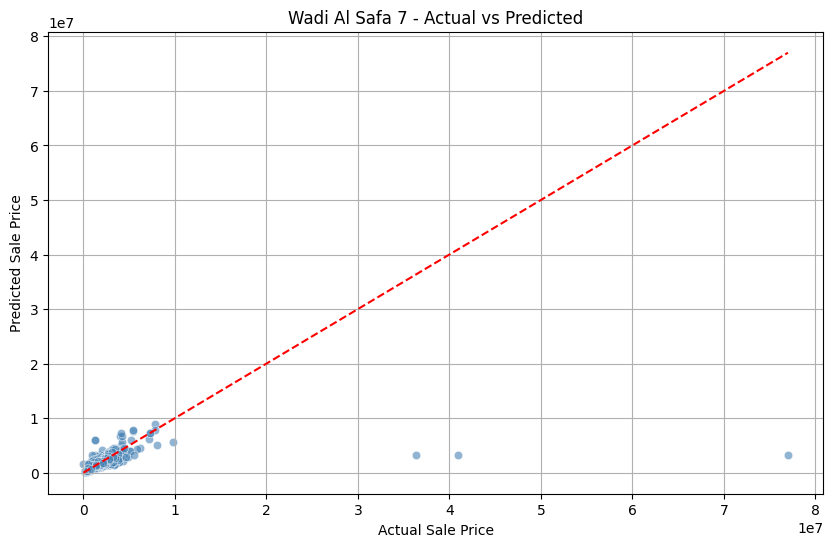

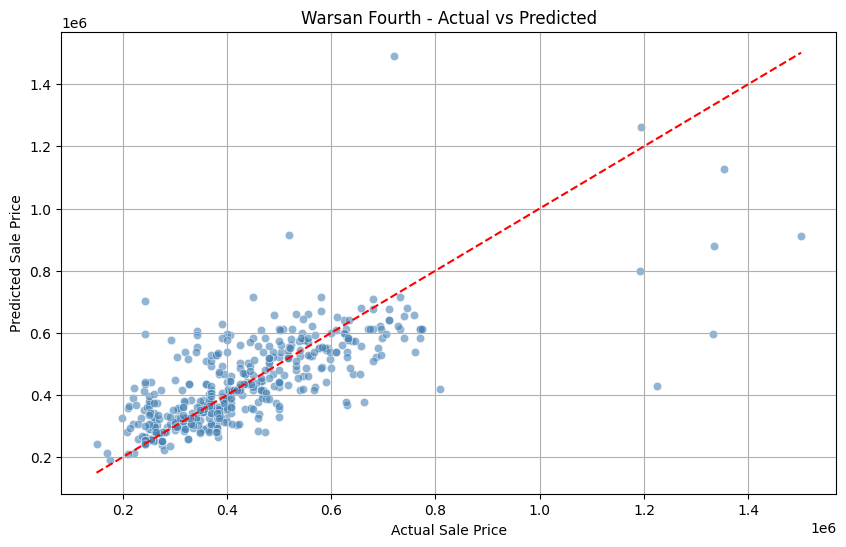

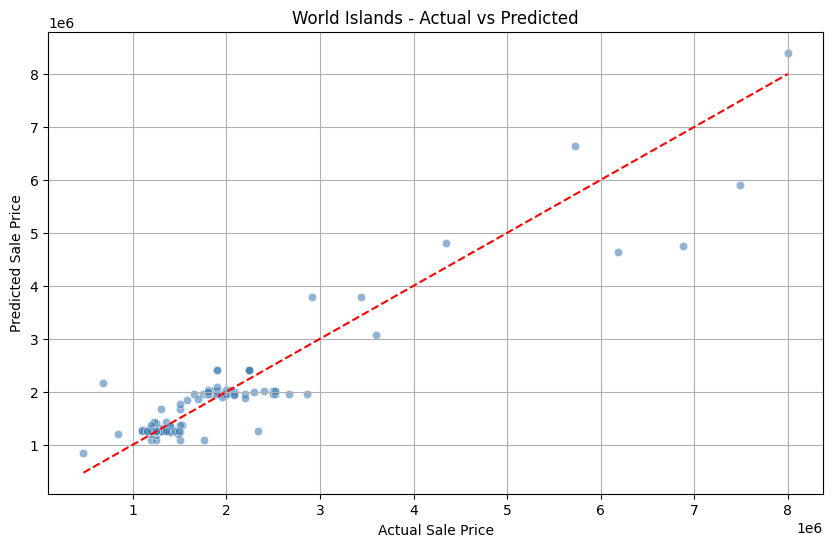

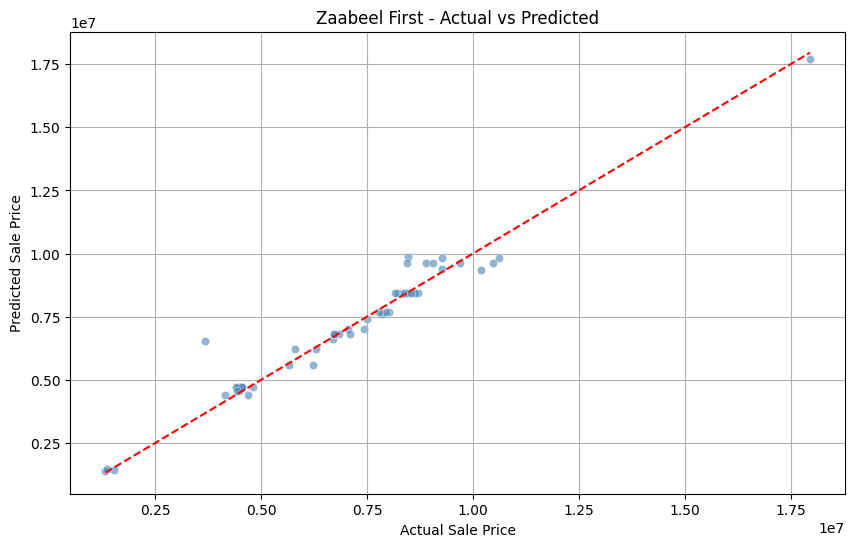

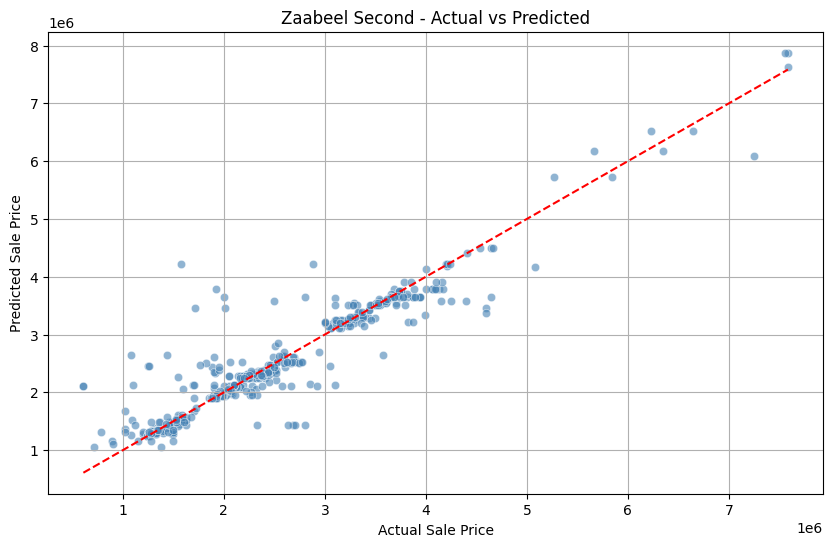

In [13]:
# Random Forest Plot
for prop_type in models.keys():  # Use the area names as keys
    # Retrieve the corresponding model and X_test
    model = models[prop_type]
    X_test = X_tests[prop_type]

    # Retrieve the corresponding actual values from processed_data
    # Ensure y_test corresponds to the same subset of data as X_test
    y_test = processed_data.loc[X_test.index, 'actual_worth']  # Align y_test with X_test

    # Get the predictions for this area
    y_pred = model.predict(X_test)

    # Plot Actual vs Predicted
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_test, y=y_pred, color='steelblue', alpha=0.6)
    
    # Add a red dashed line representing perfect prediction
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--', color='red')
    
    # Title and labels
    plt.title(f'{prop_type} - Actual vs Predicted')
    plt.xlabel('Actual Sale Price')
    plt.ylabel('Predicted Sale Price')
    plt.grid(True)
    plt.show()

In [12]:
# Convert results to DataFrame
evaluation_df = pd.DataFrame(evaluation_results)
evaluation_df.to_csv("area_model_evaluation.csv", index=False)

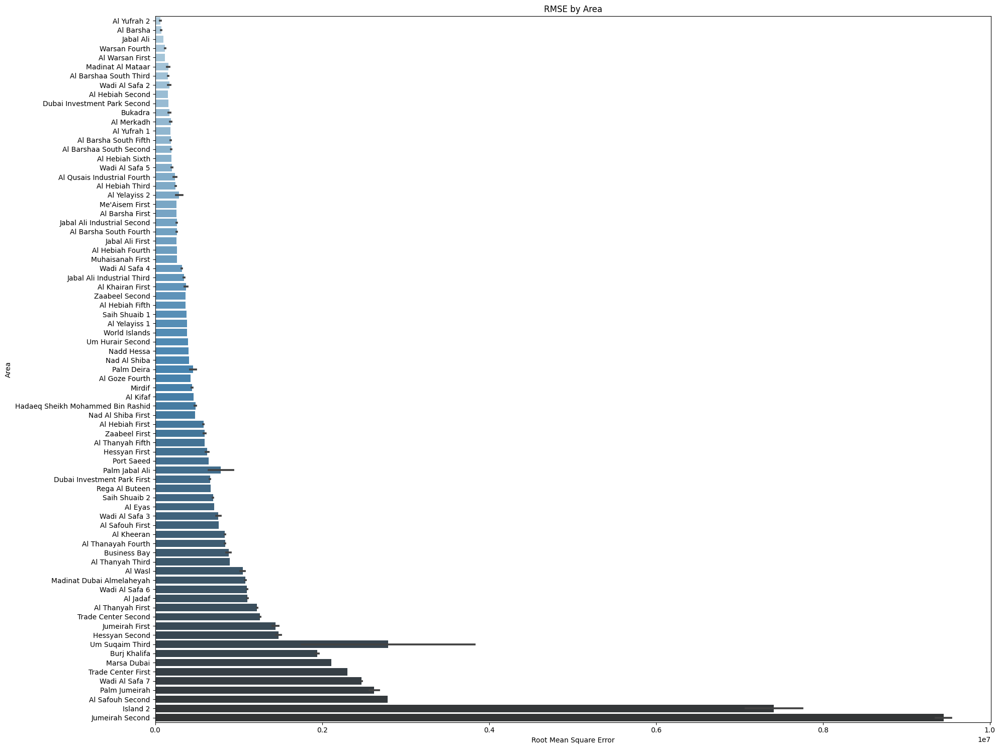

In [16]:
# RMSE plot
plt.figure(figsize=(20, 15))
sns.barplot(data=evaluation_df.sort_values(by="RMSE"), x="RMSE", y="Area", palette="Blues_d")
plt.title("RMSE by Area")
plt.xlabel("Root Mean Square Error")
plt.ylabel("Area")
plt.tight_layout()
plt.savefig("area_model_rmse.png")
plt.show()

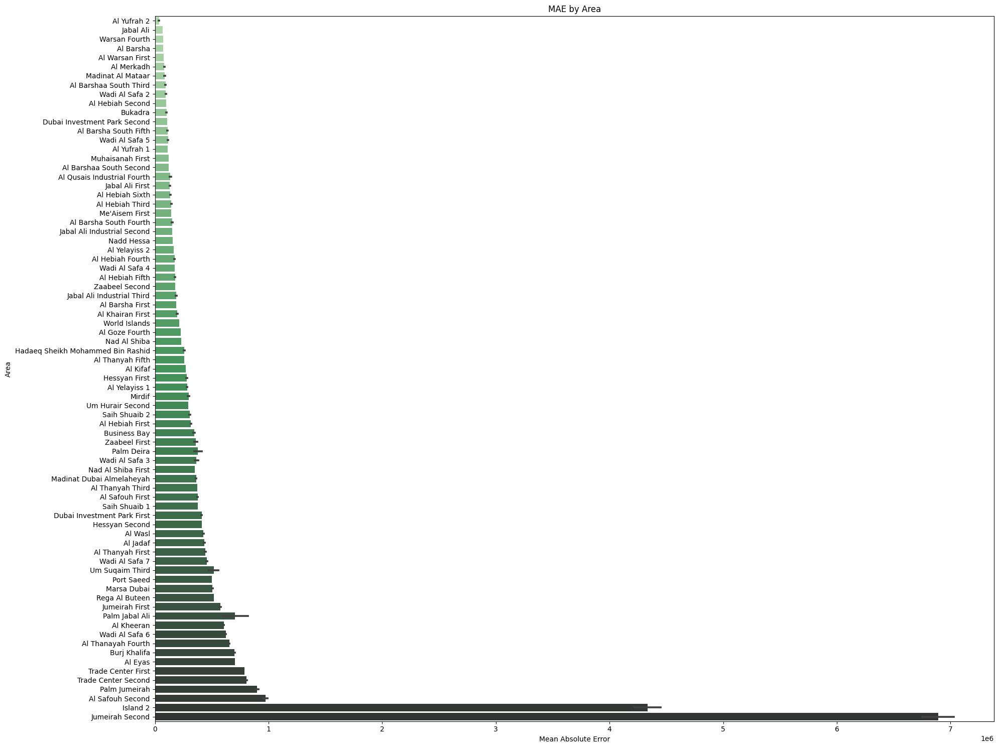

In [17]:
# MAE plot
plt.figure(figsize=(20, 15))
sns.barplot(data=evaluation_df.sort_values(by="MAE"), x="MAE", y="Area", palette="Greens_d")
plt.title("MAE by Area")
plt.xlabel("Mean Absolute Error")
plt.ylabel("Area")
plt.tight_layout()
plt.savefig("area_model_mae.png")
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
C:\Users\Chamodi\AppData\Roaming\Python\Python311\site-packages\numpy\lib\nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


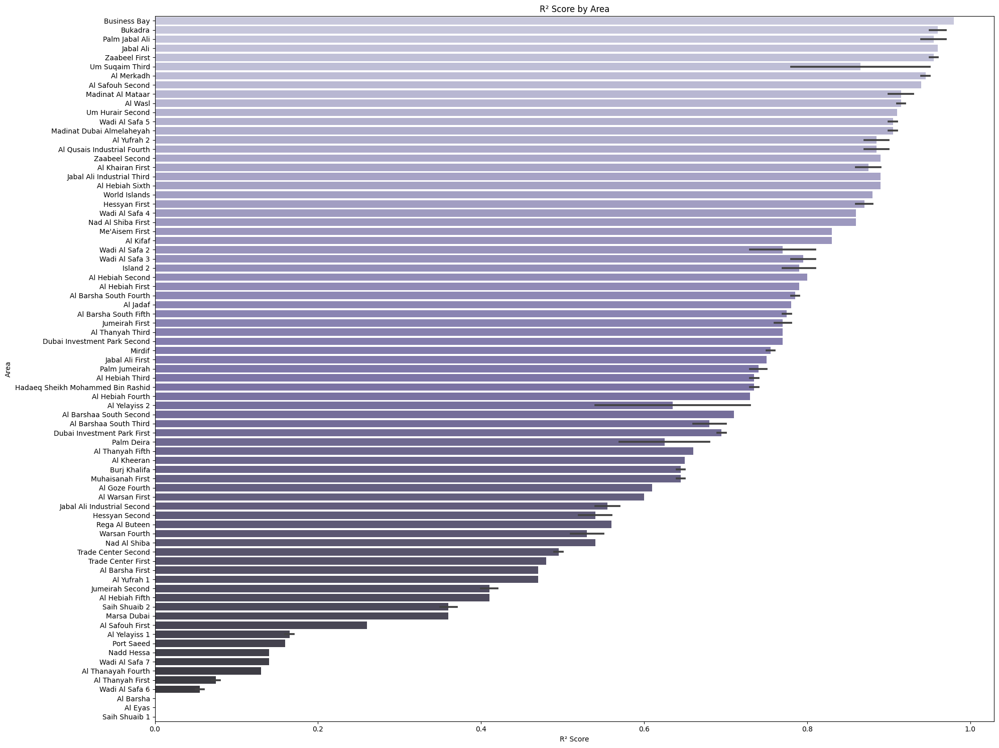

In [18]:
# R² Score plot
plt.figure(figsize=(20, 15))
sns.barplot(data=evaluation_df.sort_values(by="R2", ascending=False), x="R2", y="Area", palette="Purples_d")
plt.title("R² Score by Area")
plt.xlabel("R² Score")
plt.ylabel("Area")
plt.tight_layout()
plt.savefig("area_model_r2.png")
plt.show()